In [1]:
'''
Author: David Brin
Date Created: 1/20/2025

This notebook is to rerun stats and plots from the primate spike dataset by groups
where each group is created by fixing all but one relevant parameter to explain what parameters result in significant results.
'''

'\nAuthor: David Brin\nDate Created: 1/20/2025\n\nThis notebook is to rerun stats and plots from the primate spike dataset by groups\nwhere each group is created by fixing all but one relevant parameter to explain what parameters result in significant results.\n'

## Imports

In [2]:
#imports
#  taken from 'stats_from_allMonkey_filt'  --> unused imports
%matplotlib inline
%config InlineBackend.figure_format = 'retina' # high res plotting

import sys
sys.path.append(r'..\..\..\spikeparam')

from spikeparam.patch.fit import Spike
from spikeparam.patch.fit import SpikeGroup

from neurodsp import spectral

from scipy import signal
import scipy

import h5py
from tqdm import tqdm

import numpy as np
import pandas as pd

from neurodsp import filt
from neurodsp.timefrequency import amp_by_time, phase_by_time
from neurodsp.plts import plot_time_series, plot_instantaneous_measure
from neurodsp.plts.time_series import plot_bursts
from neurodsp.burst import detect_bursts_dual_threshold, compute_burst_stats

from scipy.signal import sosfiltfilt, butter

from scipy.signal import find_peaks
from scipy.optimize import curve_fit
from scipy.stats import pearsonr
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.metrics.pairwise import cosine_similarity

import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import scipy.spatial as sp_spatial
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd


import os

from fooof import FOOOF

sns.set(rc={'figure.figsize':(12,9)})
sns.set_style('whitegrid')
sns.set_style("whitegrid", {'axes.grid' : False})

import IProgress

import openpyxl
import glob

import pickle

C:\Users\david\AppData\Local\Temp\ipykernel_3696\2694937235.py:48: DeprecationWarning: 
The `fooof` package is being deprecated and replaced by the `specparam` (spectral parameterization) package.
This version of `fooof` (1.1) is fully functional, but will not be further updated.
New projects are recommended to update to using `specparam` (see Changelog for details).
  from fooof import FOOOF


## Define functions

In [3]:
# Functions to save a datrame to a pickle file and another to extract the data from the pickle file

def save_dataframe_to_pickle(dataframe, file_path):
    """
    Function to save a DataFrame as a pickle file.
    
    Args:
    - dataframe (pd.DataFrame): DataFrame to be saved.
    - file_path (str): Path to save the pickle file.
    """
    dataframe.to_pickle(file_path)

def load_dataframe_from_pickle(file_path):
    """
    Function to extract a DataFrame from a pickle file.
    
    Args:
    - file_path (str): Path to the pickle file.
    
    Returns:
    - dataframe (pd.DataFrame): Loaded DataFrame.
    """
    dataframe = pd.read_pickle(file_path)
    return dataframe

def save_dict_to_pickle(dictionary, filepath):
    """
    Save a dictionary to a pickle file.

    Parameters:
        dictionary (dict): The dictionary to save.
        filepath (str): The path to the pickle file.
    """
    with open(filepath, 'wb') as f:
        pickle.dump(dictionary, f)
    print(f"Dictionary saved to {filepath}")


def load_dict_from_pickle(filepath):
    """
    Load a dictionary from a pickle file.

    Parameters:
        filepath (str): The path to the pickle file.

    Returns:
        dict: The loaded dictionary.
    """
    with open(filepath, 'rb') as f:
        dictionary = pickle.load(f)
    print(f"Dictionary loaded from {filepath}")
    return dictionary

In [4]:
def create_comparison_groups(df, metadata_cols):
    results = []

    for varying_col in metadata_cols:
        # Columns to keep fixed (all except the varying one)
        fixed_cols = [col for col in metadata_cols if col != varying_col]

        # Group data by fixed metadata columns
        grouped = df.groupby(fixed_cols)
        subcomparison_index = 1

        for group_name, group_data in grouped:
            # Get unique values for the varying column within the fixed group
            varying_groups = group_data[varying_col].unique()

            # Ensure there are at least two values for the varying column
            if len(varying_groups) > 1:
                # Create a single subcomparison that includes all varying groups
                subsets = {value: group_data[group_data[varying_col] == value] for value in varying_groups}
                
                results.append({
                    'Subcomparison': subcomparison_index,
                    'Varying Metadata': varying_col,
                    'Fixed Metadata': ', '.join([f"{col}={val}" for col, val in zip(fixed_cols, group_name)]) if log_isinstance(group_name, tuple) else f"{fixed_cols[0]}={group_name}",
                    'Groups': {value: len(subset) for value, subset in subsets.items()}
                })

                subcomparison_index += 1

    return pd.DataFrame(results)


In [5]:
def print_ANOVA(df, condition):
    '''
    prints ANOVA results for each feature
    
    params: df- the data frame to look through (for groups)
            condition- the non-fixed metadata variable
    
    returns: nothing, prints results
    '''
    # Define the spike features and conditions
    spike_features = ['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp', 'peak_width', 
                           'peak_sharpness', 'exp_lambda', 'exp_const', 'log_isi', 'r_squared_ramp']
    # Initialize a dictionary to store ANOVA results
    anova_results = {feature: {} for feature in spike_features}
    # Perform ANOVA for each spike feature against each condition
    for feature in spike_features:
        groups = [df[feature][df[condition] == cond] for cond in df[condition].unique()]  #scrutinize
        anova_results[feature][condition] = scipy.stats.f_oneway(*groups)
    # Print the ANOVA results
    for feature, results in anova_results.items():
        print(f"ANOVA results for {feature}:")
        for condition, result in results.items():
            if result:
                f_value, p_value = result
                print(f"  Condition: {condition}, F-value: {f_value}, p-value: {p_value:.10e}")

In [6]:
def print_PostHoc(df, condition):
    '''
    prints PostHoc Tukey results for each feature
    
    params: df- the data frame to look through (for groups)
            condition- the non-fixed metadata variable
    
    returns: nothing, prints results
    '''

    # Define the spike features and conditions
    spike_features = ['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp', 'peak_width', 
                      'peak_sharpness', 'exp_lambda', 'exp_const', 'log_isi', 'r_squared_ramp']
    
    # Initialize a dictionary to store Tukey's test results
    tukey_results = {feature: None for feature in spike_features}
    
    # Perform ANOVA and Tukey's test for each spike feature against the given condition
    for feature in spike_features:
        model_formula = f'{feature} ~ C({condition})'
        model = smf.ols(model_formula, data=df).fit()
        anova_table = sm.stats.anova_lm(model, typ=2)
        
        # If ANOVA shows significant results, perform Tukey's test
        if anova_table["PR(>F)"].iloc[0] < 0.05:
            try:
                tukey = pairwise_tukeyhsd(endog=df[feature].astype(float),
                                          groups=df[condition].astype(str),
                                          alpha=0.05)
                tukey_results[feature] = tukey.summary()
            except Exception as e:
                print(f'Error performing Tukey\'s test for {feature} under {condition}: {e}')

    # Print the Tukey's test results for each feature
    for feature, result in tukey_results.items():
        print(f'Tukey\'s test results for {feature}:')
        if result is not None:
            print(result)
        else:
            print(f'No significant differences found for {feature}.')
        print('\n')

In [7]:
def boxplots_byParam_byGroup(param, df):
    """
    Generates box plots for specific columns in a DataFrame, grouped by a specified parameter.

    This function creates box plots for a predefined list of columns, with the data grouped by the values of the specified parameter. 
    The box plots provide a visual summary of the distribution of the data for each group, highlighting the median, quartiles, and potential outliers.

    Parameters:
    - param (str): The column name in the DataFrame by which to group the data.
        Each unique value in this column will form a separate group in the box plots.
    - df (pandas df): the group to get the data from

    Returns:
    None: The function displays the box plots.
    """
    # Set the style of the plots
    sns.set(style="whitegrid")
    
    # Define the list of columns to plot
    columns_to_plot = ['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp', 'peak_width', 
                       'peak_sharpness', 'exp_lambda', 'exp_const', 'log_isi', 'r_squared_ramp']
    
    # Create box plots for each column controlling for 'brainOrigin'
    for column in columns_to_plot:
        plt.figure(figsize=(10, 6))
        
        sns.boxplot(x=param, y=column, data=df)
        plt.title(f'Box Plot of {column} by {param}')
        plt.xlabel(param)
        plt.ylabel(column)
        plt.xticks(rotation=45)  # Rotate x-axis labels for better vlog_isibility
        plt.show()



In [8]:
#taken from stats_from_allMonkeyDFs_filt,      edited to show the number of spikes
def plot_waveform(df, combined_dict_filt, metadata_param = None, median = False, Overlapped = False):
    """
    Plots the average spike waveforms with standard deviation shading.

    This function generates plots of average spike waveforms from a dictionary of spike data. The function can filter
    the data based on a specified metadata parameter and plot the results either separately or overlapped.

    Parameters:
    - df (pd.DataFrame): The DataFrame containing metadata about the spike data.
    - combined_dict_filt (dict): A dictionary where keys are formatted as "{file_name} {Sweep_#}" and values are arrays of spike data.
    - metadata_param (str, optional): The column name in the DataFrame to filter the data by. Each unique value in this column will have its own plot.
    - median (bool, optional): If True, calculates the median spike waveform instead of the mean.
    - Overlapped (bool, optional): If True, plots the average waveforms for all unique values of the metadata parameter on a single plot.
        If False, creates separate plots for each unique value.

    Returns:
    None: The function displays the plots.
    """
    if metadata_param is not None:
        parameters = df[metadata_param].unique()

        if Overlapped: # Create the plot
            plt.figure(figsize=(10, 6))
             # Set the labels and title
            plt.xlabel('Time')
            plt.ylabel('mVs')
            plt.ylim(-80, 55)
            plt.title('Overall Average Spike with Standard Deviation for ' + str(metadata_param))
        for value in parameters:
            # Filter the DataFrame for the current unique value
            param_data = df[df[metadata_param] == value]
            all_spikes = []

            for index, row in param_data.iterrows():
                key = row['Spike_ID']
            
                if key in combined_dict_filt:
                    all_spikes.append(np.array(combined_dict_filt[key]))  # Preserve spike structure
            
            # Convert the list of spike arrays into a 2D NumPy array
            if len(all_spikes) > 0:
                all_spikes_array = np.array(all_spikes, dtype=object)  # Keeps each row variable-length (in case of varying  lengths)
                all_spikes_array = np.vstack(all_spikes)  # Stack into 2D array
            else:
                print(f"No valid spikes found for {value}")
                continue


            if not Overlapped:
                # Create the plot
                plt.figure(figsize=(10, 6))
                # Set the labels and title
                plt.xlabel('Time')
                plt.ylabel('mVs')
                plt.ylim(-75, 55)
                plt.title('Overall Average Spike with Standard Deviation for ' + str(value))
            # Calculate the average and standard deviation across all spike arrays
            if median:    
                mean_spike = np.median(all_spikes_array, axis=0)
            else:
                mean_spike = np.mean(all_spikes_array, axis=0)
            std_spike = np.std(all_spikes_array, axis=0)
                    
            plt.plot(mean_spike, label=f'Average Spike {metadata_param}:{value}')
            plt.fill_between(range(len(mean_spike)), mean_spike - std_spike, mean_spike + std_spike,
                             alpha=0.2, label='±1 Standard Deviation')
        
            if not Overlapped:    #plots individual graphs
                plt.legend()
                plt.show()

        if Overlapped:           #plots overlapped graphs
            plt.legend()
            plt.show()

    else:                       #creates an average spike graph of all spikes
        all_spikes = []

        # Aggregate all spike arrays from all keys
        for key, spike_data in combined_dict_filt.items():
            all_spikes.append(spike_data)
        
        # Convert the list of all spikes to a numpy array for easier manipulation
        all_spikes_array = np.array(all_spikes)
    
        # Calculate the average and standard deviation across all spike arrays
        mean_spike = np.mean(all_spikes_array, axis=0)
        std_spike = np.std(all_spikes_array, axis=0)
    
        # Create the plot
        plt.figure(figsize=(10, 6))
        plt.plot(mean_spike, label='Average Spike', color='b')
        plt.fill_between(range(len(mean_spike)), mean_spike - std_spike, mean_spike + std_spike, 
                         color='b', alpha=0.2, label='±1 Standard Deviation')
        
        # Set the labels and title
        plt.xlabel('Time')
        plt.ylabel('mVs')
        plt.title('Overall Average Spike with Standard Deviation')
        plt.legend()
    
        # Show the plot
        plt.show()


In [9]:

def combined_boxplots(param, grouped_dfs_dict):
    """
    Generates separate box plots for each parameter, grouped by dataset groups, 
    with ANOVA-based significance annotations.

    - Each plot corresponds to one parameter (e.g., ramp_amp, peak_amp, etc.).
    - Within each plot, each dataset group (from grouped_dfs_dict keys) is on the x-axis.
    - Different colors represent the different values of the metadata (e.g., 'S' vs 'A' for dendriticType).
    - Significance stars are added above respective boxplots based on ANOVA results.

    Parameters:
    - param (str): The metadata category to filter by (e.g., "dendriticType").
    - grouped_dfs_dict (dict): Dictionary where keys are "{param} {group}", and 
                               values are corresponding sub-dataframes.

    Returns:
    None: Displays separate box plots for each parameter.
    """

    sns.set(style="whitegrid")
    
    # Define the columns to plot
    columns_to_plot = ['ramp_amp', 'inflection_time', 'inflection_amp', 'peak_amp', 'peak_width', 
                       'peak_sharpness', 'exp_lambda', 'exp_const', 'log_isi', 'r_squared_ramp']
    
    # **Filter** only data frames relevant to the given param
    filtered_dfs = {key: df for key, df in grouped_dfs_dict.items() if key.startswith(param)}
    
    if not filtered_dfs:
        print(f"No data frames found for param '{param}'.")
        return
    
    # Create a combined DataFrame for plotting
    combined_df = []
    for key, df in filtered_dfs.items():
        group_name = " ".join(key.split(" ")[1:])  # Extract dataset group name
        df = df.copy()  # Ensure modification safety
        
        if param not in df.columns:
            print(f"Warning: '{param}' not found in {key}. Skipping this group.")
            continue
        
        df.loc[:, 'MetadataValue'] = df[param]  # Assign varying metadata column
        df.loc[:, 'Group'] = group_name  # Assign group name (from dictionary key)
        combined_df.append(df)
    
    combined_df = pd.concat(combined_df, ignore_index=True)

    # **Generate a separate boxplot for each parameter**
    for column in columns_to_plot:
        plt.figure(figsize=(15, 7))
        
        ax = sns.boxplot(
            x='Group', 
            y=column, 
            hue='MetadataValue',  # Color by different metadata values (e.g., 'S' vs 'A')
            data=combined_df
        )

        plt.title(f'Box Plot of {column} by {param}')
        plt.xlabel(f'Dataset Groups (by {param})')
        plt.ylabel(column)
        plt.xticks(rotation=45)
        plt.legend(title=f'{param} Value', bbox_to_anchor=(1.05, 1), loc='upper left')

        # **ANOVA for significance testing per dataset group**
        group_positions = {}  # Store x positions for annotation
        for idx, grp in enumerate(combined_df['Group'].unique()):
            subset = combined_df[combined_df['Group'] == grp]

            if len(subset['MetadataValue'].unique()) > 1:  # Ensure multiple groups exist
                values = [subset[column][subset['MetadataValue'] == meta_val] for meta_val in subset['MetadataValue'].unique()]
                f_value, p_value = scipy.stats.f_oneway(*values)

                # Determine significance stars
                significance = ""
                if p_value < 0.0001:
                    significance = "****"
                elif p_value < 0.001:
                    significance = "***"
                elif p_value < 0.01:
                    significance = "**"
                elif p_value < 0.05:
                    significance = "*"

                # **Store position for annotation**
                
                group_positions[grp] = (idx, max(subset[column]) +.05*(max(subset[column])-min(subset[column])), significance)

        # **Add annotations for each dataset group**
        for grp, (x_pos, y_pos, stars) in group_positions.items():
            if stars:
                
                plt.text(x_pos, y_pos, stars, ha='center', va='bottom', fontsize=12, color='red')

        plt.show()


In [10]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors
import math

def plot_waveforms_grid(sub_dfs_dict, param, combined_dict_filt, median=False):
    """
    Plots overlapping waveforms for all sub_dfs filtered by a specific parameter, ensuring that 
    waveforms for different types are plotted together in a single figure per DataFrame.
    The y-axis is set to a unified scale based on the global min/max values across all spikes.

    Parameters:
    - sub_dfs_dict (dict): Dictionary where keys are sub_df names and values are DataFrames.
    - param (str): The metadata parameter to vary across traces.
    - combined_dict_filt (dict): Dictionary where keys are formatted as "{file_name} {Sweep_#}" 
      and values are arrays of spike data.
    - median (bool, optional): If True, calculates the median spike waveform instead of the mean.

    Returns:
    None: The function displays the plots.
    """

    # Filter DataFrames to only include those that match the param
    filtered_dfs = {key: df for key, df in sub_dfs_dict.items() if key.startswith(param)}

    if not filtered_dfs:
        print(f"No data frames found for param: {param}")
        return

    # Collect all unique values of param across all DataFrames
    all_unique_values = set()
    for sub_df in filtered_dfs.values():
        all_unique_values.update(sub_df[param].unique())

    # Generate a consistent color mapping
    cmap = plt.get_cmap('Dark2')  # Use a predefined colormap
    norm = mcolors.Normalize(vmin=0, vmax=len(all_unique_values) - 1)
    color_map = {value: cmap(norm(i)) for i, value in enumerate(all_unique_values)}

    # Collect all spike min/max values for global scaling
    all_min_values = []
    all_max_values = []
    for sub_df in filtered_dfs.values():
        for _, row in sub_df.iterrows():
            spike_key = row['Spike_ID']
            if spike_key in combined_dict_filt:
                spike_waveform = np.array(combined_dict_filt[spike_key])
                all_min_values.append(spike_waveform.min())
                all_max_values.append(spike_waveform.max())

    if not all_min_values or not all_max_values:
        print("No valid spike data found.")
        return
    global_min = min(all_min_values) - 5
    global_max = max(all_max_values) + 5

    num_dfs = len(filtered_dfs)
    num_cols = 2  # Display 2 plots per row
    num_rows = (num_dfs + 1) // num_cols  # Compute needed rows

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 2 * num_rows))  # Adjust size based on rows
    axes = axes.flatten()  # Flatten in case of 1D behavior

    n = {}
    for idx, (name, sub_df) in enumerate(filtered_dfs.items()):
        ax = axes[idx]

        unique_values = sub_df[param].unique()

        for value in unique_values:
            subset_df = sub_df[sub_df[param] == value]
            all_spikes = []

            for _, row in subset_df.iterrows():
                spike_key = row['Spike_ID']
                if spike_key in combined_dict_filt:
                    all_spikes.append(np.array(combined_dict_filt[spike_key]))

            if not all_spikes:
                continue  # Skip if no valid spikes found
            n[value] = len(all_spikes)
            all_spikes_array = np.vstack(all_spikes)
            mean_spike = np.median(all_spikes_array, axis=0) if median else np.mean(all_spikes_array, axis=0)
            std_spike = np.std(all_spikes_array, axis=0)

            # Use consistent color
            color = color_map[value]

            ax.plot(mean_spike, label=f"{param}: {value}", linewidth=1.5, color=color)
            ax.fill_between(range(len(mean_spike)), mean_spike - std_spike, mean_spike + std_spike, alpha=0.2, color=color)

  
        ax.set_xlabel('Time', fontsize=8)
        ax.set_ylabel('mVs', fontsize=8)
        ax.set_title(f"{name}", fontsize=10)
        handles = [plt.Line2D([0], [0], color=color_map[val], lw=2) for val in unique_values]
        labels = [f"{param}: {val}, n= {n[val]}" for val in unique_values]
        ax.legend(handles, labels, loc='upper right', fontsize=6)

        # Apply global y-axis limits
        ax.set_ylim(global_min, global_max)

    # Hide any unused axes
    for j in range(idx + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    
    
    

    plt.show()


In [11]:
def plot_firing_rate_distributions(grouped_dfs_dict, firing_rates):
    """
    Generates boxplots, violin plots, and bar plots for firing rates extracted from grouped sub_dfs.

    - Uses the spikeID in sub_df to access the firing rate of the sweep the spike is from.
    - Ensures each sweep is counted only once using a set (used_keys).
    - Generates separate boxplots, violin plots, and bar plots.

    Parameters:
    - grouped_dfs_dict (dict): Dictionary where keys are "{param} {group}", and values are corresponding sub-dataframes.
    - firing_rates (dict): Dictionary mapping sweep keys to their corresponding firing rates.

    Returns:
    None: Displays the plots.
    """

    sns.set(style="whitegrid")

    # Create a combined DataFrame for plotting
    combined_data = []

    for key in grouped_dfs_dict.keys():
        sub_df = grouped_dfs_dict[key]
        group_name = key  # Extract dataset group name
        used_keys = set()  # Track used sweep keys to avoid duplicates

        for spike_id in sub_df['Spike_ID']:
            sweep_key = spike_id.split("Sp")[0]  # Extract key before "Sp"
            #print(sweep_key)
            
            if sweep_key in firing_rates and sweep_key not in used_keys:
                firing_rate = firing_rates[sweep_key]
                used_keys.add(sweep_key)  # Mark this sweep as used
                #print("key found")
                
                combined_data.append({"Group": group_name, "FiringRate": firing_rate})

    if not combined_data:
        print("No valid firing rate data found.")
        return

    combined_df = pd.DataFrame(combined_data)

    # **Boxplot**
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='Group', y='FiringRate', data=combined_df, palette="Set2")
    plt.xlabel('Group')
    plt.ylabel('Firing Rate (Hz)')
    plt.title('Firing Rate Distribution Across Groups')
    plt.xticks(rotation=45)
    plt.show()

    # **Violin Plot**
    plt.figure(figsize=(12, 6))
    sns.violinplot(x='Group', y='FiringRate', data=combined_df, palette="coolwarm")
    plt.xlabel('Group')
    plt.ylabel('Firing Rate (Hz)')
    plt.title('Firing Rate Distribution (Violin Plot)')
    plt.xticks(rotation=45)
    plt.show()

    # **Bar Plot (Mean Firing Rate with SD)**
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Group', y='FiringRate', data=combined_df, ci="sd", palette="Blues")
    plt.xlabel('Group')
    plt.ylabel('Mean Firing Rate (Hz)')
    plt.title('Mean Firing Rate Across Groups')
    plt.xticks(rotation=45)
    plt.show()


## Load in Data

In [12]:
allMonkey_df = load_dataframe_from_pickle(r"C:\Users\david\Documents\Voytek Research\spike_proj\primate Dataset\allMonkey_df_filt.pkl")

In [13]:
allMonkey_df.groupby(['Sweep_#','file_name']).ngroups

2311

In [14]:
combined_dict_filt = load_dict_from_pickle(r"C:\Users\david\Documents\Voytek Research\spike_proj\primate Dataset\combined_dict_filt.pkl")

Dictionary loaded from C:\Users\david\Documents\Voytek Research\spike_proj\primate Dataset\combined_dict_filt.pkl


In [15]:
len(combined_dict_filt.keys())

9302

In [16]:
grouping_results_df = load_dataframe_from_pickle(r"C:\Users\david\Documents\Voytek Research\spike_proj\primate Dataset\groupingResults.pkl")

In [17]:
grouping_results_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 108 entries, 0 to 107
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Subcomparison     108 non-null    int64 
 1   Varying Metadata  108 non-null    object
 2   Fixed Metadata    108 non-null    object
 3   Groups            108 non-null    object
dtypes: int64(1), object(3)
memory usage: 3.5+ KB


In [18]:
allMonkey_df.head()

,ramp_amp,inflection_time,inflection_amp,peak_amp,peak_width,peak_sharpness,exp_lambda,exp_const,r_squared_ramp,r_squared_exp,...,dendriticType,SomaLayerLoc,brainOrigin,Weight,Sex,Age,Species,Firing_Rate,Pulse_Type,log_isi
1,1.832248,0.6,-38.827516,11.984253,0.55,3.929138,5.981717,-53.646425,0.950116,0.831859,...,A,3.0,PFC,6.3,F,9.96,Macaca fascicularis,0.4,LP,1.750894
2,1.725643,0.6,-38.571168,11.453247,0.55,3.533936,6.194347,-53.275150,0.969743,0.804736,...,A,3.0,PFC,6.3,F,9.96,Macaca fascicularis,0.4,LP,1.749736
3,1.762723,0.6,-39.727784,11.669922,0.60,3.567505,5.819483,-53.277108,0.975530,0.854182,...,A,3.0,PFC,6.3,F,9.96,Macaca fascicularis,0.4,LP,NaN
5,2.058032,0.6,-39.135743,11.889649,0.55,3.807068,6.171128,-52.532920,0.963031,0.800281,...,A,3.0,PFC,6.3,F,9.96,Macaca fascicularis,1.4,LP,1.810904
7,2.350725,0.6,-38.891602,11.648560,0.60,3.855896,6.057973,-52.542671,0.992663,0.815669,...,A,3.0,PFC,6.3,F,9.96,Macaca fascicularis,1.4,LP,1.828338


In [19]:
sub_dfs_dict = {}  # Dictionary to store sub dataframes
rejected = 0
for _, row in grouping_results_df.iterrows():
    # Extract fixed metadata as a dictionary
    fixed_metadata = {}
    for item in row['Fixed Metadata'].split(", "):
        key, val = item.split("=")
        val = val if "." not in val or not val.replace(".", "", 1).isdigit() else float(val)
        fixed_metadata[key.strip()] = val
        



    varying_metadata_str = row['Varying Metadata']  
    dict_key = f"{varying_metadata_str} {row['Subcomparison']}"

    print(f'Processing: {dict_key}')

    # Filter allMonkey_df for rows matching the fixed metadata
    condition = pd.Series(True, index=allMonkey_df.index)
    for col, val in fixed_metadata.items():
        condition &= allMonkey_df[col] == val

    # Create a sub DataFrame for this group
    sub_df = allMonkey_df[condition]

    if sub_df.shape[0] == 0:  
        print(f" No match for fixed_metadata!!")
        rejected += 1
        print(f"number rejected: {rejected}")
        continue

    # Store sub_df in the dictionary
    sub_dfs_dict[dict_key] = sub_df

display(len(sub_dfs_dict))


Processing: dendriticType 1
Processing: dendriticType 2
Processing: dendriticType 3
Processing: dendriticType 4
Processing: dendriticType 5
Processing: dendriticType 6
Processing: dendriticType 7
Processing: dendriticType 8
Processing: dendriticType 9
Processing: dendriticType 10
Processing: dendriticType 11
Processing: dendriticType 12
Processing: dendriticType 13
Processing: dendriticType 14
Processing: dendriticType 15
Processing: dendriticType 16
Processing: dendriticType 17
Processing: dendriticType 18
Processing: dendriticType 19
Processing: dendriticType 20
Processing: dendriticType 21
Processing: dendriticType 22
Processing: SomaLayerLoc 1
Processing: SomaLayerLoc 2
Processing: SomaLayerLoc 3
Processing: SomaLayerLoc 4
Processing: SomaLayerLoc 5
Processing: SomaLayerLoc 6
Processing: SomaLayerLoc 7
Processing: SomaLayerLoc 8
Processing: SomaLayerLoc 9
Processing: SomaLayerLoc 10
Processing: SomaLayerLoc 11
Processing: SomaLayerLoc 12
Processing: SomaLayerLoc 13
Processing: Soma

108

In [20]:
display(type(sub_dfs_dict['dendriticType 1']))

pandas.core.frame.DataFrame

In [21]:
sub_dfs_dict.keys()

dict_keys(['dendriticType 1', 'dendriticType 2', 'dendriticType 3', 'dendriticType 4', 'dendriticType 5', 'dendriticType 6', 'dendriticType 7', 'dendriticType 8', 'dendriticType 9', 'dendriticType 10', 'dendriticType 11', 'dendriticType 12', 'dendriticType 13', 'dendriticType 14', 'dendriticType 15', 'dendriticType 16', 'dendriticType 17', 'dendriticType 18', 'dendriticType 19', 'dendriticType 20', 'dendriticType 21', 'dendriticType 22', 'SomaLayerLoc 1', 'SomaLayerLoc 2', 'SomaLayerLoc 3', 'SomaLayerLoc 4', 'SomaLayerLoc 5', 'SomaLayerLoc 6', 'SomaLayerLoc 7', 'SomaLayerLoc 8', 'SomaLayerLoc 9', 'SomaLayerLoc 10', 'SomaLayerLoc 11', 'SomaLayerLoc 12', 'SomaLayerLoc 13', 'SomaLayerLoc 14', 'SomaLayerLoc 15', 'SomaLayerLoc 16', 'brainOrigin 1', 'brainOrigin 2', 'brainOrigin 3', 'brainOrigin 4', 'brainOrigin 5', 'brainOrigin 6', 'brainOrigin 7', 'brainOrigin 8', 'brainOrigin 9', 'brainOrigin 10', 'brainOrigin 11', 'brainOrigin 12', 'brainOrigin 13', 'brainOrigin 14', 'brainOrigin 15', 'S

## Plots by Group

In [22]:
'''# should add labels
for key, varying_metadata in zip(sub_dfs_dict.keys(), grouping_results_df['Varying Metadata']):
    sub_df = sub_dfs_dict[key]
    plot_waveform(sub_df, combined_dict_filt, metadata_param = varying_metadata, median = True, Overlapped = True)
'''

"# should add labels\nfor key, varying_metadata in zip(sub_dfs_dict.keys(), grouping_results_df['Varying Metadata']):\n    sub_df = sub_dfs_dict[key]\n    plot_waveform(sub_df, combined_dict_filt, metadata_param = varying_metadata, median = True, Overlapped = True)\n"

In [23]:
'''metadata_cols = ["dendriticType", "SomaLayerLoc", "brainOrigin", "Species", "Sex" ]
for key in sub_dfs_dict:
    sub_df = sub_dfs_dict[key]
    # Find the varying metadata column (or None if not found)
    varying_metadata = next(
        (col for col in metadata_cols if sub_df[col].nunique() > 1), None
    )
    
    if varying_metadata is None:
        print("No varying metadata found for this group.") 
        continue  # Skip this group if no varying metadata is found

    # Call the function with the identified metadata parameter
    plot_waveform(sub_df, combined_dict_filt, metadata_param=varying_metadata, median=False, Overlapped=True)
    boxplots_byParam_byGroup(varying_metadata, sub_df)
'''

'metadata_cols = ["dendriticType", "SomaLayerLoc", "brainOrigin", "Species", "Sex" ]\nfor key in sub_dfs_dict:\n    sub_df = sub_dfs_dict[key]\n    # Find the varying metadata column (or None if not found)\n    varying_metadata = next(\n        (col for col in metadata_cols if sub_df[col].nunique() > 1), None\n    )\n    \n    if varying_metadata is None:\n        print("No varying metadata found for this group.") \n        continue  # Skip this group if no varying metadata is found\n\n    # Call the function with the identified metadata parameter\n    plot_waveform(sub_df, combined_dict_filt, metadata_param=varying_metadata, median=False, Overlapped=True)\n    boxplots_byParam_byGroup(varying_metadata, sub_df)\n'

#### Combined Plots 

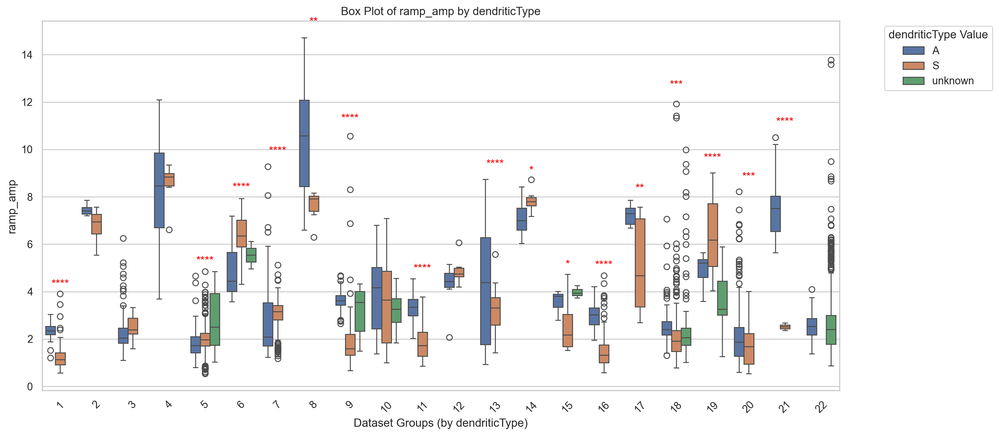

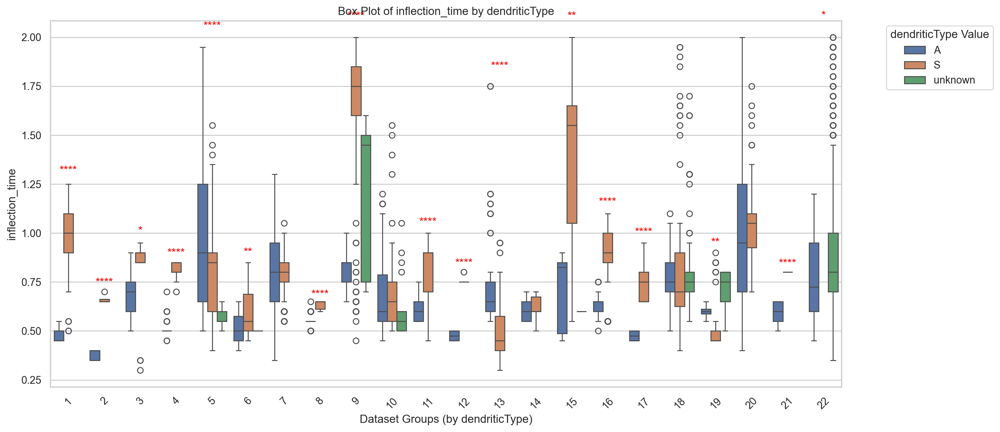

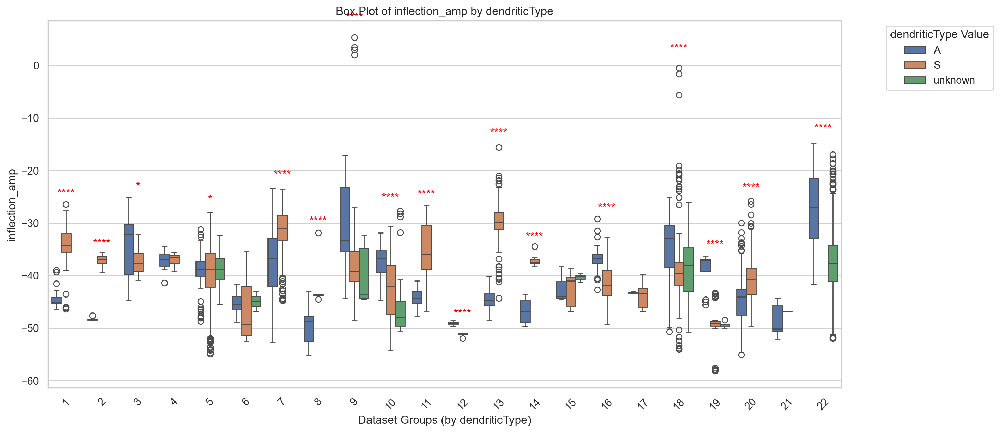

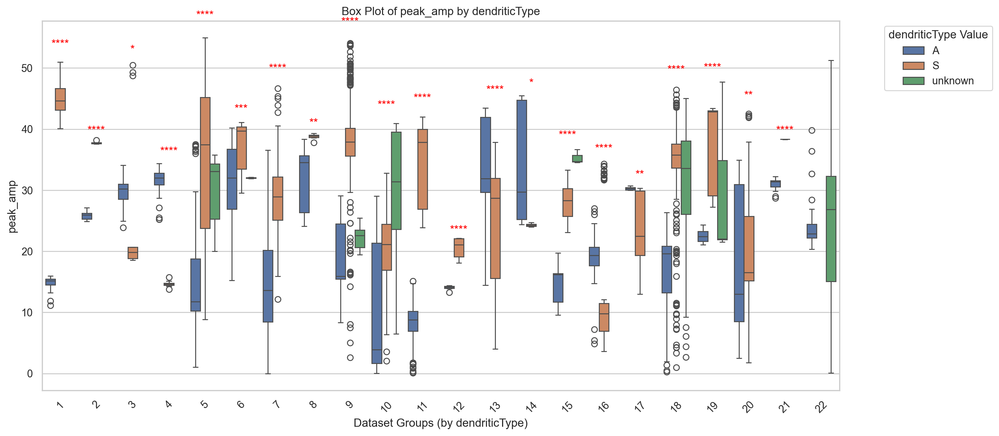

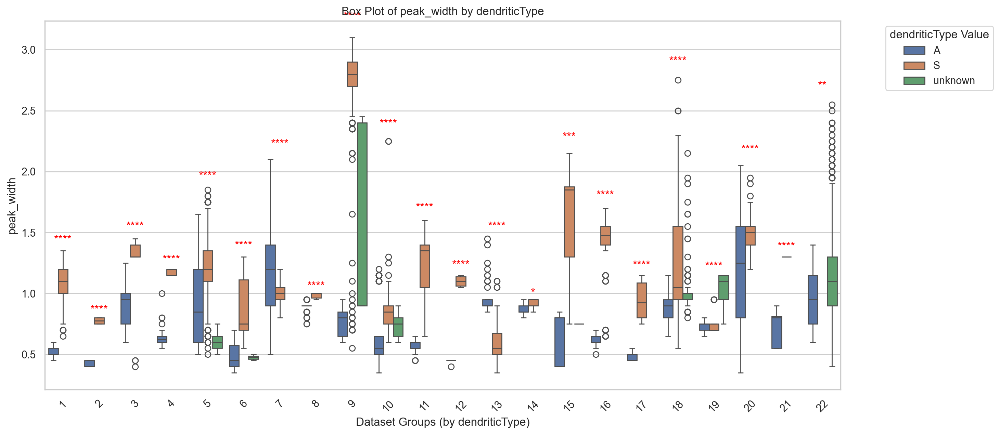

...

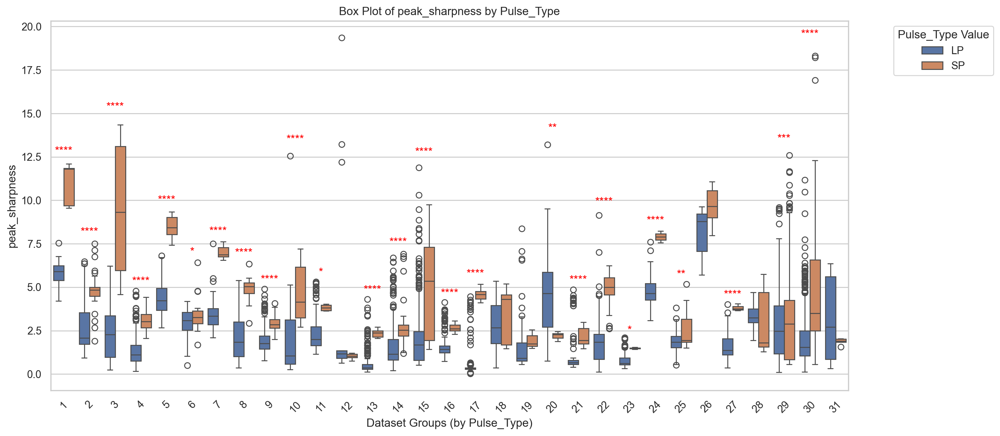

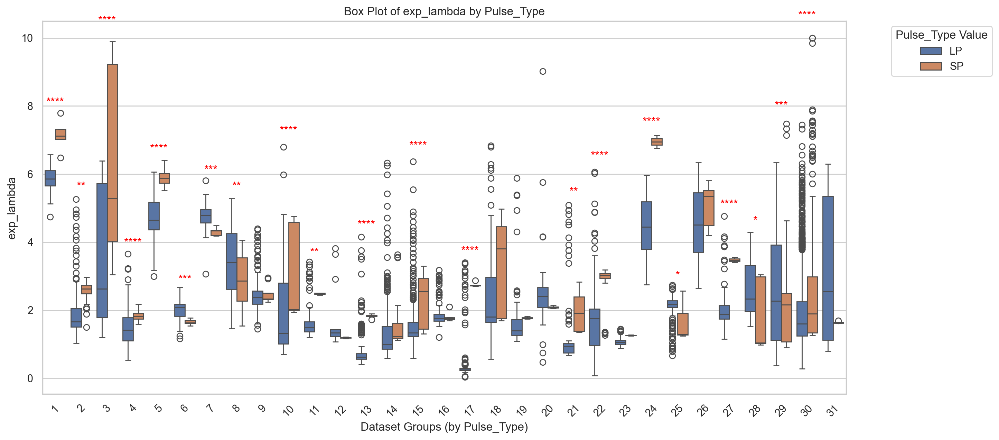

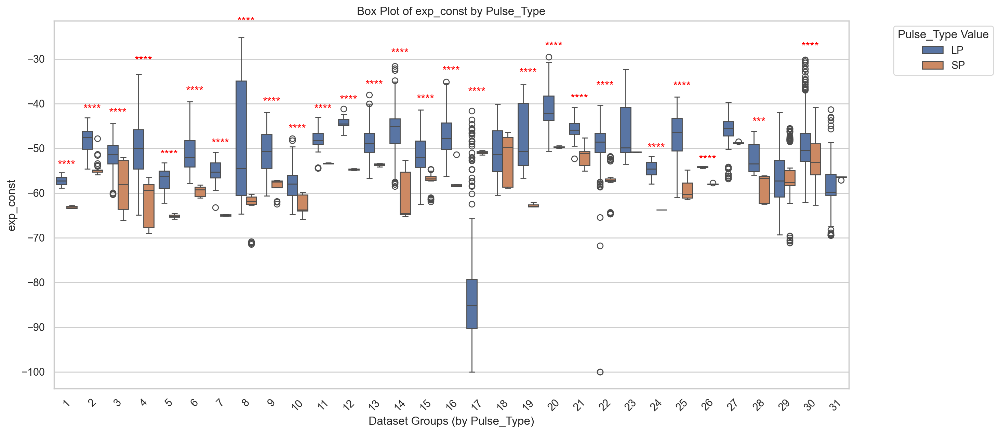

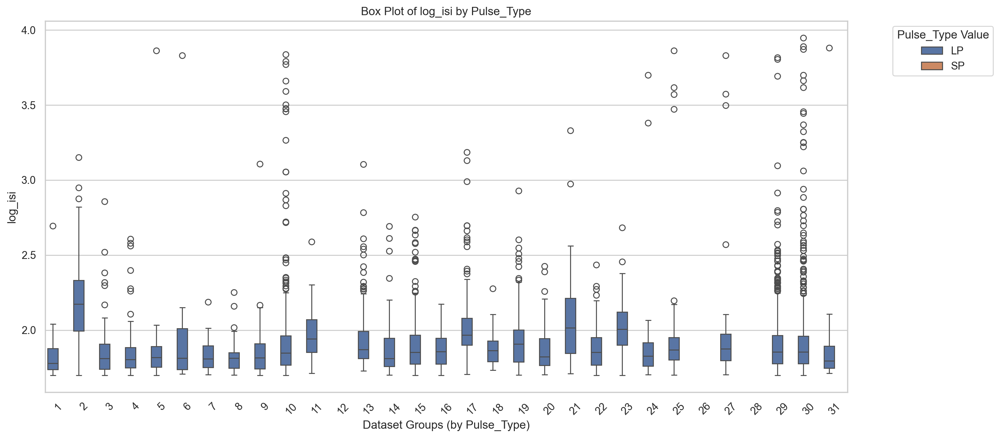

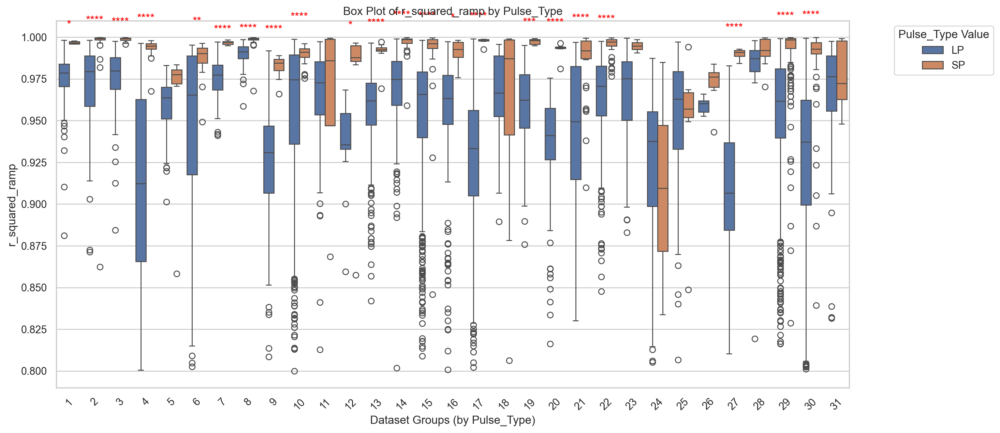

In [24]:
varyingMetadata = grouping_results_df['Varying Metadata'].unique()
for param in varyingMetadata:
    combined_boxplots(param, sub_dfs_dict)

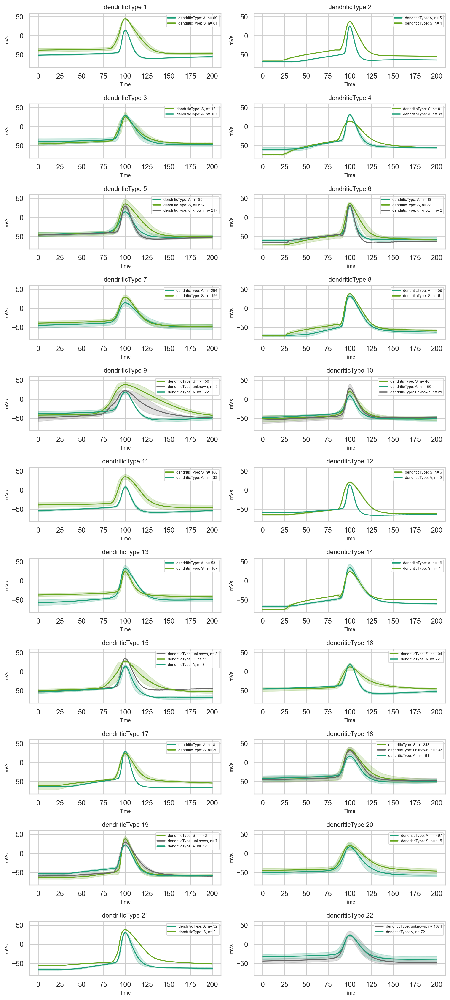

In [25]:
plot_waveforms_grid(sub_dfs_dict, "dendriticType", combined_dict_filt, median=False)

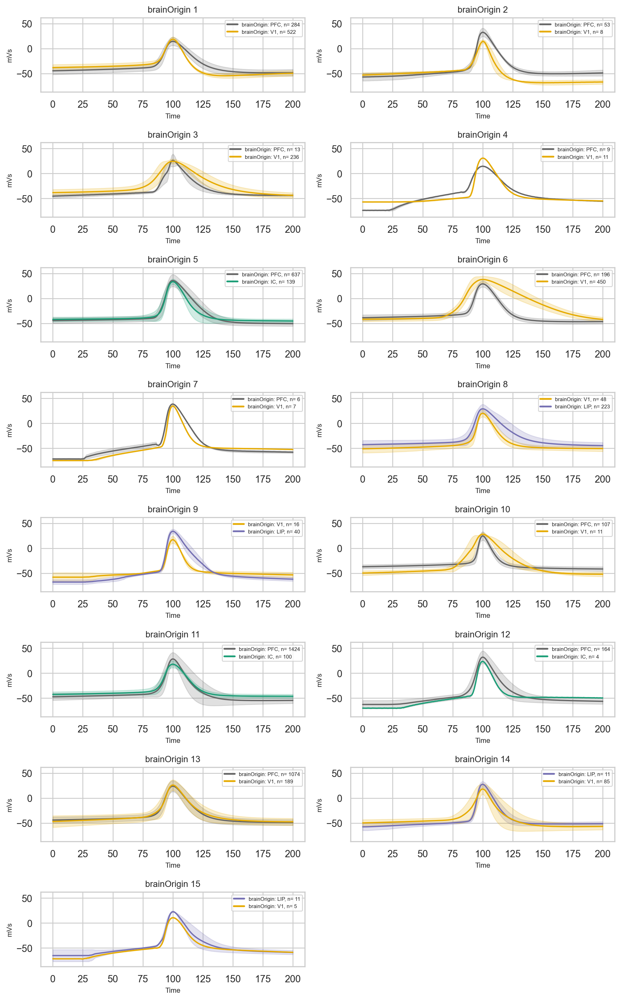

In [26]:
plot_waveforms_grid(sub_dfs_dict, "brainOrigin", combined_dict_filt, median=False)

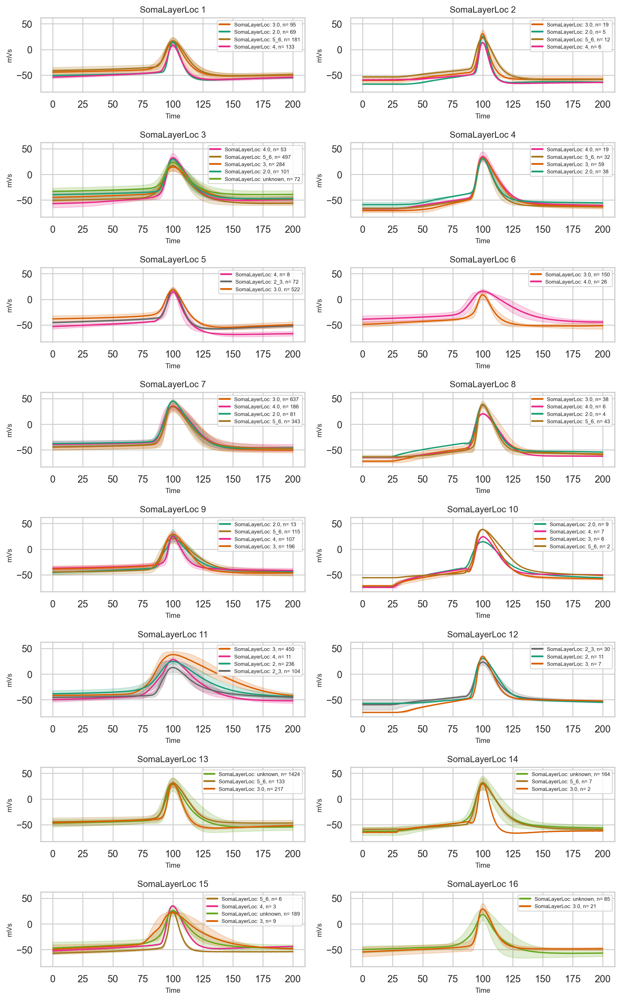

In [27]:
plot_waveforms_grid(sub_dfs_dict, "SomaLayerLoc", combined_dict_filt, median=False)

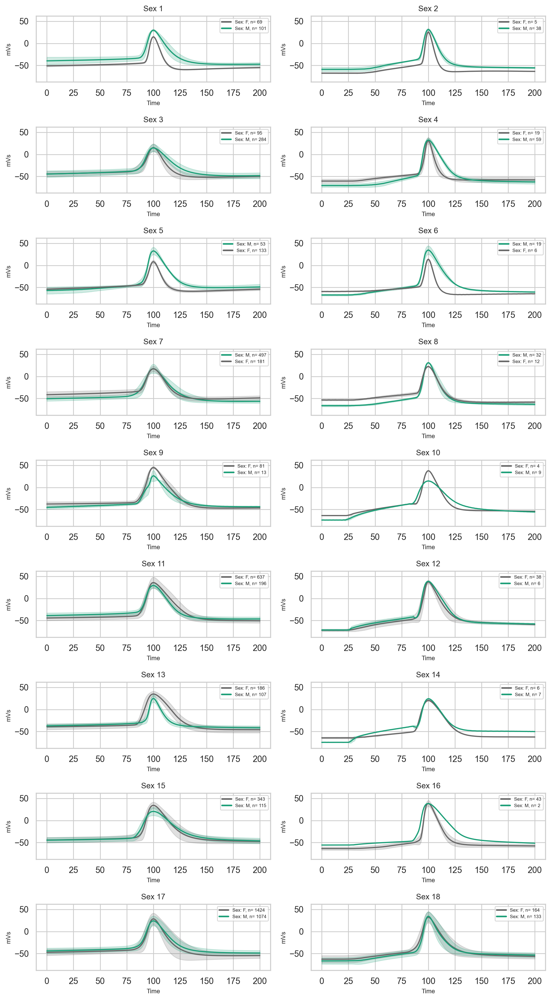

In [28]:
plot_waveforms_grid(sub_dfs_dict, "Sex", combined_dict_filt, median=False)

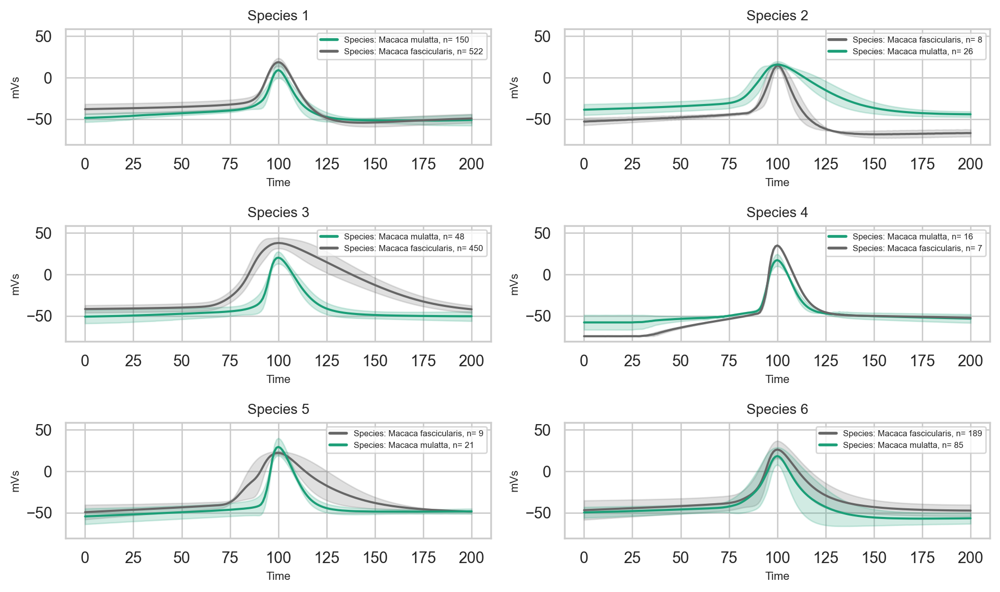

In [29]:
plot_waveforms_grid(sub_dfs_dict, "Species", combined_dict_filt, median=False)

## Stats by Group

In [30]:
'''metadata_cols = ["dendriticType", "SomaLayerLoc", "brainOrigin", "Species", "Sex" ]
index = 0
for key in sub_dfs_dict:
    sub_df = sub_dfs_dict[key]
    print(index)
    index +=1
    varying_metadata = next(
        (col for col in metadata_cols if sub_df[col].nunique() > 1), None
    )
    
    if varying_metadata is None:
        print("No varying metadata found for this group.") 
        continue

    print_ANOVA(sub_df, varying_metadata)
'''

'metadata_cols = ["dendriticType", "SomaLayerLoc", "brainOrigin", "Species", "Sex" ]\nindex = 0\nfor key in sub_dfs_dict:\n    sub_df = sub_dfs_dict[key]\n    print(index)\n    index +=1\n    varying_metadata = next(\n        (col for col in metadata_cols if sub_df[col].nunique() > 1), None\n    )\n    \n    if varying_metadata is None:\n        print("No varying metadata found for this group.") \n        continue\n\n    print_ANOVA(sub_df, varying_metadata)\n'

In [31]:
'''for key in sub_dfs_dict:
    sub_df = sub_dfs_dict[key]
    varying_metadata = next(
        (col for col in metadata_cols if sub_df[col].nunique() > 1), None
    )
    
    if varying_metadata is None:
        print("No varying metadata found for this group.") 
        continue
    print(varying_metadata)
    print_PostHoc(sub_df, varying_metadata)'''


'for key in sub_dfs_dict:\n    sub_df = sub_dfs_dict[key]\n    varying_metadata = next(\n        (col for col in metadata_cols if sub_df[col].nunique() > 1), None\n    )\n    \n    if varying_metadata is None:\n        print("No varying metadata found for this group.") \n        continue\n    print(varying_metadata)\n    print_PostHoc(sub_df, varying_metadata)'

## Firing rates

In [32]:
firing_rates = load_dict_from_pickle(r"C:\Users\david\Documents\Voytek Research\spike_proj\primate Dataset\firing_rates.pkl")

Dictionary loaded from C:\Users\david\Documents\Voytek Research\spike_proj\primate Dataset\firing_rates.pkl


C:\Users\david\AppData\Local\Temp\ipykernel_3696\1754010987.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Group', y='FiringRate', data=combined_df, palette="Set2")


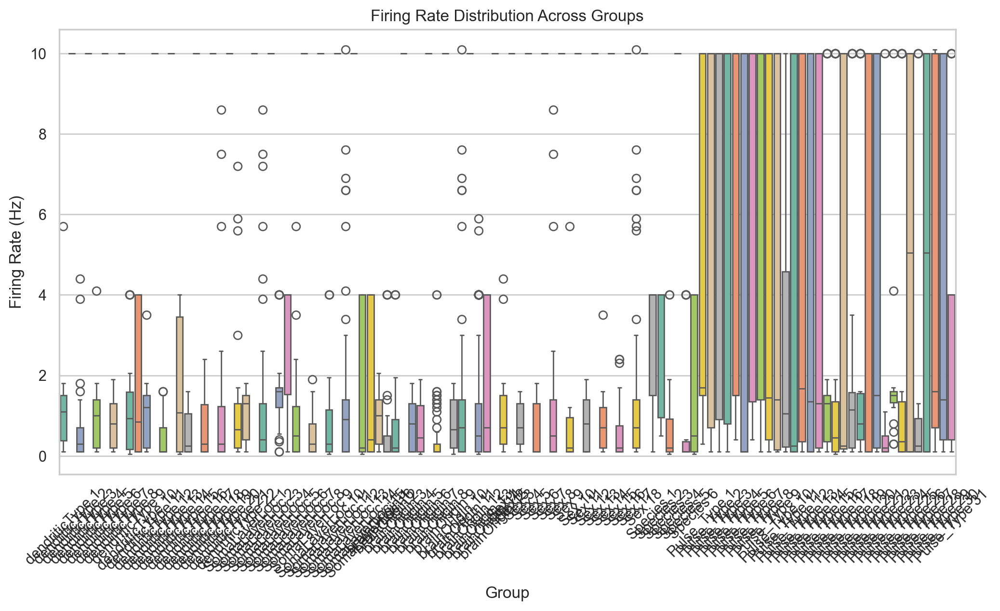

C:\Users\david\AppData\Local\Temp\ipykernel_3696\1754010987.py:55: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x='Group', y='FiringRate', data=combined_df, palette="coolwarm")


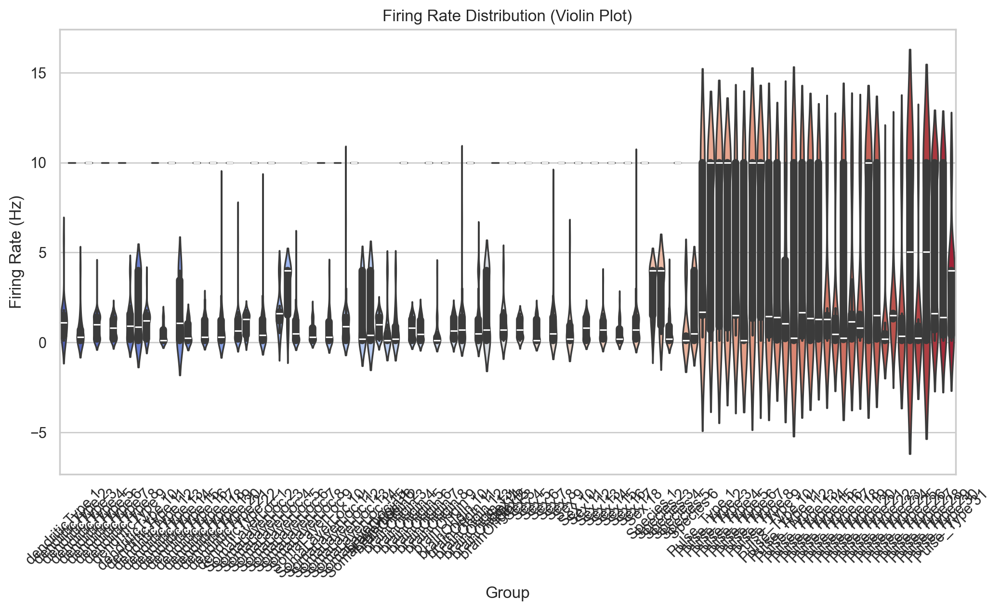

C:\Users\david\AppData\Local\Temp\ipykernel_3696\1754010987.py:64: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar='sd'` for the same effect.

  sns.barplot(x='Group', y='FiringRate', data=combined_df, ci="sd", palette="Blues")
C:\Users\david\AppData\Local\Temp\ipykernel_3696\1754010987.py:64: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Group', y='FiringRate', data=combined_df, ci="sd", palette="Blues")


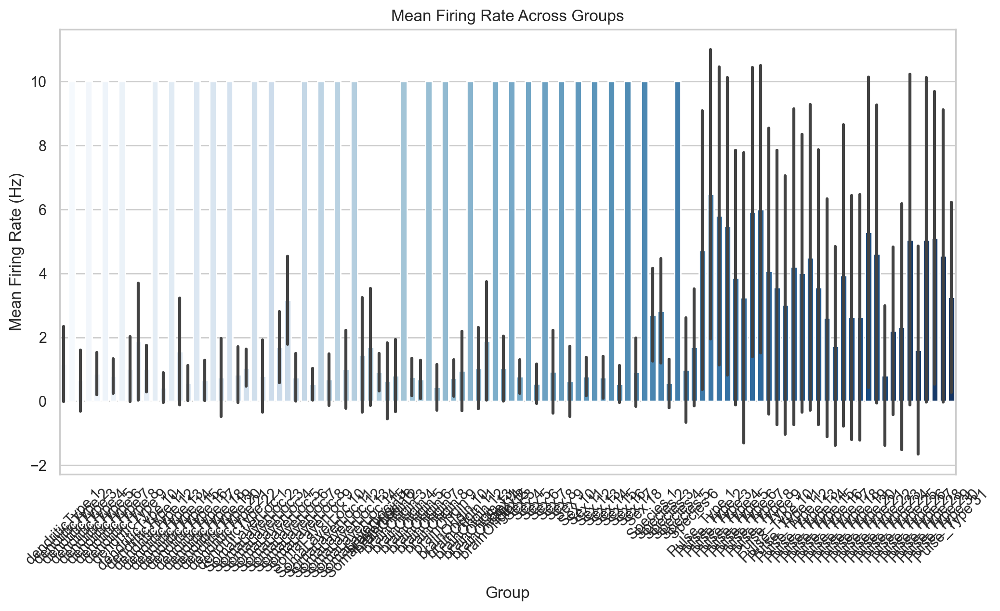

In [33]:
plot_firing_rate_distributions(sub_dfs_dict, firing_rates)